In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

In [2]:
dataset1=pd.read_csv('covid.csv')
dataset1.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [3]:
dataset1.isnull().sum()

Country/Region        0
Continent             1
Population            1
TotalCases            0
NewCases            205
TotalDeaths          21
NewDeaths           206
TotalRecovered        4
NewRecovered        206
ActiveCases           4
Serious,Critical     87
Tot Cases/1M pop      1
Deaths/1M pop        22
TotalTests           18
Tests/1M pop         18
WHO Region           25
iso_alpha             0
dtype: int64

In [4]:
dataset1.shape

(209, 17)

In [6]:
dataset1.drop(columns={'NewCases','NewDeaths','NewRecovered'},inplace=True)

In [9]:
dataset1.isnull().sum()

Country/Region       0
Continent            1
Population           1
TotalCases           0
TotalDeaths         21
TotalRecovered       4
ActiveCases          4
Serious,Critical    87
Tot Cases/1M pop     1
Deaths/1M pop       22
TotalTests          18
Tests/1M pop        18
WHO Region          25
iso_alpha            0
dtype: int64

In [10]:
dataset2=pd.read_csv('covid_grouped.csv')
dataset2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [11]:
dataset2.shape

(35156, 11)

In [12]:
dataset2.isnull().sum()

Date              0
Country/Region    0
Confirmed         0
Deaths            0
Recovered         0
Active            0
New cases         0
New deaths        0
New recovered     0
WHO Region        0
iso_alpha         0
dtype: int64

In [13]:
dataset1.head(1)

,Country/Region,Continent,Population,TotalCases,TotalDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,331198130.0,5032179,162804.0,2576668.0,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA


# Bar graphs- Comparisons between COVID infected countries in terms of total cases, total deaths, total recovered

In [23]:
px.bar(dataset1.head(20),x='Country/Region',y='TotalCases',color='Country/Region',
       hover_data={'TotalDeaths','TotalRecovered'},title='Country vs. Total cases')

In [35]:
px.bar(dataset1.head(15),x='TotalTests',y='Country/Region',orientation='h',color='TotalTests',
       title='Country vs. Total tests')

In [37]:
px.bar(dataset1.head(15),x='TotalTests',y='Continent',orientation='h',color='TotalTests',
       title='Continent vs. Total tests')

# Data Visualization through Bubble Charts-Continent Wise

In [56]:
px.scatter(dataset1,x='Continent',y='TotalCases',color='Continent',size='TotalCases', 
           hover_data={'TotalDeaths','TotalRecovered'},title='Continent wise Total cases',size_max=80)

In [58]:
px.scatter(dataset1.head(20),x='Continent',y='TotalTests',color='Continent', 
           title='Continent wise Total tests',size='TotalTests',size_max=80)

# Data Visualization through Bubble Charts-Country Wise

In [54]:
px.scatter(dataset1.head(30),x='Country/Region',y='TotalCases',color='Country/Region',
       hover_data={'TotalDeaths','TotalRecovered'},title='Country vs. Total cases',size='TotalCases',size_max=80)

In [60]:
px.scatter(dataset1.head(20), x='Country/Region', y= 'Tests/1M pop',  
           hover_data=['Country/Region', 'Continent'], 
           color='Country/Region', size= 'Tests/1M pop', size_max=80,title='Country vs. Tests/1M pop')

In [63]:
px.scatter(dataset1.head(30), x='TotalCases', y= 'TotalDeaths', 
           hover_data={'Country/Region', 'Continent'},color='Country/Region', size= 'TotalDeaths', 
           size_max=80,title='Total cases vs. Total deaths')


In [64]:
px.scatter(dataset1.head(30), x='TotalTests', y= 'TotalDeaths', 
           hover_data={'Country/Region', 'Continent'},color='Country/Region', size= 'TotalTests', 
           size_max=80,title='Total tests vs. Total deaths')


# Bar graphs for All top infected Countries

In [68]:
df1=dataset2.groupby('Country/Region')['Confirmed'].sum().sort_values(ascending=False)[:20]
df1

Country/Region
US                224345948
Brazil             89524967
Russia             45408411
India              40883464
Spain              27404045
United Kingdom     26748587
Italy              26745145
France             21210926
Germany            21059152
Iran               19339267
Peru               19263916
Turkey             17903345
Chile              16935654
Mexico             14946202
China              14132002
Pakistan           12833994
Saudi Arabia       12362961
South Africa       11168743
Canada              9356551
Bangladesh          8754729
Name: Confirmed, dtype: int64

In [71]:
px.bar(data_frame=df1,x=df1.index,y=df1.values,color=df1.index,title='Top 20 infected countries')

In [77]:
df2=dataset2.groupby('Date')['Confirmed'].sum().sort_values(ascending=False)[:20]
df2

Date
2020-07-27    16480485
2020-07-26    16251796
2020-07-25    16047190
2020-07-24    15791645
2020-07-23    15510481
2020-07-22    15227725
2020-07-21    14947078
2020-07-20    14713623
2020-07-19    14506845
2020-07-18    14292198
2020-07-17    14054563
2020-07-16    13812525
2020-07-15    13559984
2020-07-14    13328867
2020-07-13    13107415
2020-07-12    12914636
2020-07-11    12721968
2020-07-10    12505640
2020-07-09    12273063
2020-07-08    12044836
Name: Confirmed, dtype: int64

In [79]:
px.bar(data_frame=df2,x=df2.index,y=df2.values,color=df2.index,title='Date wise confirmed cases')

In [80]:
df3=dataset2.groupby('Date')['Deaths'].sum().sort_values(ascending=False)[:20]
df3

Date
2020-07-27    654036
2020-07-26    648621
2020-07-25    644517
2020-07-24    639650
2020-07-23    633506
2020-07-22    623540
2020-07-21    616557
2020-07-20    610319
2020-07-19    606159
2020-07-18    602130
2020-07-17    596503
2020-07-16    589760
2020-07-15    583961
2020-07-14    578468
2020-07-13    572808
2020-07-12    568993
2020-07-11    565039
2020-07-10    560142
2020-07-09    554831
2020-07-08    549373
Name: Deaths, dtype: int64

In [81]:
px.bar(data_frame=df3,x=df3.index,y=df3.values,color=df3.index,title='Date wise death cases')

In [82]:
df4=dataset2.groupby('Country/Region')['Deaths'].sum().sort_values(ascending=False)[:20]
df4

Country/Region
US                11011411
United Kingdom     3997775
Brazil             3938034
Italy              3707717
France             3048524
Spain              3033030
Mexico             1728277
India              1111831
Iran               1024136
Belgium             963679
Germany             871322
Canada              699566
China               672413
Peru                652113
Netherlands         622314
Russia              619385
Turkey              466056
Sweden              448913
Ecuador             346618
Chile               322480
Name: Deaths, dtype: int64

In [83]:
px.bar(data_frame=df4,x=df4.index,y=df4.values,color=df4.index,title='Top 20 countries with highest death cases')

# Countries Specific COVID Data Visualization: (United States)

In [85]:
df_US=dataset2.loc[dataset2['Country/Region']=='US']
df_US.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
173,2020-01-22,US,1,0,0,1,0,0,0,Americas,USA
360,2020-01-23,US,1,0,0,1,0,0,0,Americas,USA
547,2020-01-24,US,2,0,0,2,1,0,0,Americas,USA
734,2020-01-25,US,2,0,0,2,0,0,0,Americas,USA
921,2020-01-26,US,5,0,0,5,3,0,0,Americas,USA


# Bar chart

In [89]:
px.bar(df_US, x="Date", y="Confirmed", color="Confirmed",title='Date wise Confirmed cases in US')


In [90]:
px.bar(df_US, x="Date", y="Recovered", color="Recovered",title='Date wise Recovered cases in US')

In [95]:
px.line(df_US, x="Date", y="Recovered",title='Trend of Recovered cases in US')

In [94]:
px.line(df_US, x="Date", y="Deaths",title='Trend of Deaths in US')

In [97]:
px.line(df_US, x="Date", y="Confirmed",title='Trend of Confirmed cases in US')

In [98]:
px.line(df_US, x="Date", y="New cases",title='Trend of New cases in US')

# Visualization of Data in terms of Maps

In [103]:
px.choropleth(dataset2,locations='iso_alpha',color='Confirmed',hover_name='Country/Region',
              animation_frame='Date',title='Confirmed cases')

In [106]:
px.choropleth(dataset2,locations='iso_alpha',color='Deaths',animation_frame='Date',
              hover_name='Country/Region',title='Death cases',color_continuous_scale='viridis')

In [108]:
px.choropleth(dataset2,locations='iso_alpha',color='Recovered',animation_frame='Date',
              hover_name='Country/Region',title='Recovered cases',color_continuous_scale='agsunset')

# Bar graph animation

In [111]:
px.bar(dataset2,x='WHO Region',y='Confirmed',animation_frame='Date',
       title='WHO Region wise Confirmed cases',color='Confirmed')

# Visualize text using Word Cloud

In [112]:
dataset3=pd.read_csv('coviddeath.csv')
dataset3.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,NaN
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,NaN
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,NaN
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,NaN


In [113]:
dataset3.shape

(12260, 10)

In [114]:
dataset3.isnull().sum()

Data as of                      0
Start Week                      0
End Week                        0
State                           0
Condition Group                 0
Condition                       0
ICD10_codes                     0
Age Group                       0
Number of COVID-19 Deaths    6906
Flag                         5354
dtype: int64

In [115]:
dataset3.groupby('Condition').count()

,Data as of,Start Week,End Week,State,Condition Group,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition,,,,,,,,,
Adult respiratory distress syndrome,540,540,540,540,540,540,540,272,268
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
COVID-19,540,540,540,540,540,540,540,377,163
Cardiac arrest,520,520,520,520,520,520,520,219,301
Cardiac arrhythmia,540,540,540,540,540,540,540,192,348
Cerebrovascular diseases,530,530,530,530,530,530,530,187,343
Chronic lower respiratory diseases,540,540,540,540,540,540,540,229,311
Diabetes,540,540,540,540,540,540,540,276,264


In [116]:
from wordcloud import WordCloud

In [119]:
sentences=dataset3['Condition'].to_list()
sentences_as_string=" ".join(sentences)

In [120]:
sentences_as_string

'Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Respiratory failure Respiratory failure Respirato

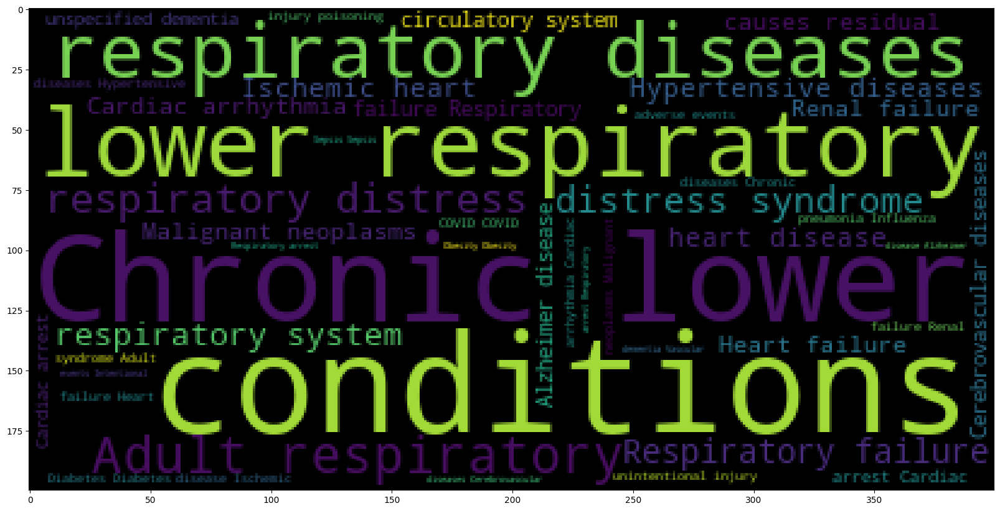

In [132]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(sentences_as_string))
plt.show()

In [127]:
sen=dataset3['Condition Group'].to_list()
sen_as_string=" ".join(sen)

In [128]:
sen_as_string

'Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory diseases Respiratory 

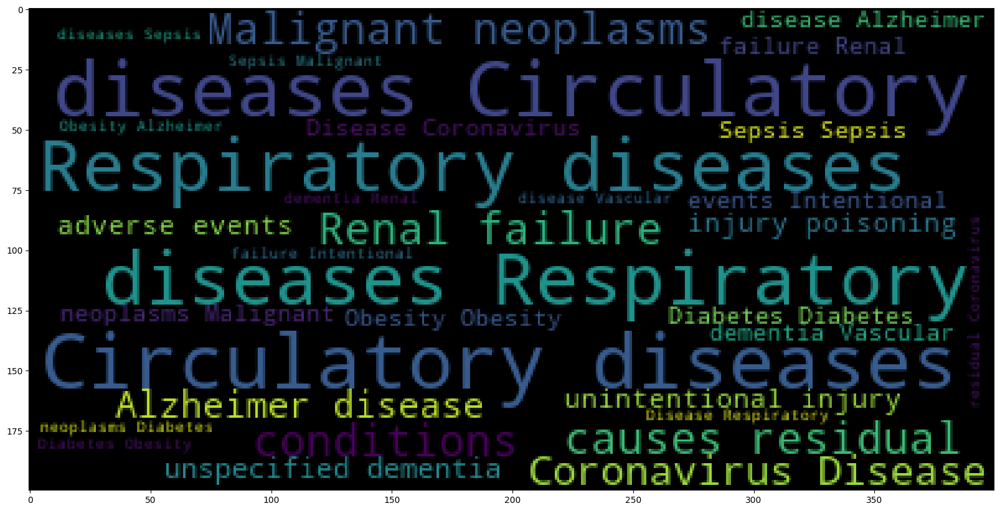

In [131]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(sen_as_string))
plt.show()